## **引入套件**

In [31]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import random
import re

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.varmax import VARMAX, VARMAXResults
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tools.eval_measures import rmse
from libarary import arima_tools
from pmdarima.utils import diff_inv

import argparse
import os
import warnings
warnings.filterwarnings("ignore")

## **讀取檔案**

In [29]:
filename = '2886_3037.csv'

In [30]:
preprocessed_path = './data/preprocessed_data'
corr_matrix = pd.read_csv(os.path.join(preprocessed_path, filename), index_col='date', parse_dates=True)
corr_matrix = corr_matrix.fillna(method='ffill')

## **平穩化**

In [8]:
diff_dict = {}
for col in corr_matrix.columns:
    if col == 'date':
        continue
    differenced_series = corr_matrix[col].copy()
    diff = 0
    isStationary = arima_tools.adf_test(corr_matrix[col])
    while not isStationary:
        diff += 1
        differenced_series = differenced_series.diff().dropna()
        isStationary = arima_tools.adf_test(differenced_series)
    diff_dict[col] = diff
max_diff = max(diff_dict.values())
print(max_diff)

0


In [9]:
transformed_matrix = corr_matrix.copy()
for i in range(max_diff):
    transformed_matrix = transformed_matrix.diff().dropna()

## **資料分割**

In [10]:
nobs = int(len(transformed_matrix) * 0.2)
train, test = transformed_matrix[0:-nobs], transformed_matrix[-nobs:]

## **auto_arima**

In [11]:
order_dict = {}
for col in transformed_matrix.columns:
    auto_model = auto_arima(transformed_matrix[col], start_p=0, start_q=0, max_p=6, 
            max_q=6, error_action='ignore', suppress_warnings=True, seasonal=False)
    info =[auto_model.order, auto_model.aic(), auto_model.bic()]
    order_dict[col] = info

In [12]:
order_dict

{'Dealer_buy': [(0, 0, 0), 67.80573301573845, 70.96478831495298],
 'Foreign_Investor_buy': [(4, 1, 1), 62.61004684683662, 84.68308800832108],
 'Investment_Trust_buy': [(1, 0, 0), 5.271952687872781, 11.590063286301838],
 'Dealer_sell': [(1, 0, 3), 110.82559108736206, 129.77992288264923],
 'Foreign_Investor_sell': [(0, 1, 1), 75.84207752909779, 82.14866071809335],
 'Investment_Trust_sell': [(1, 0, 2), 53.035119574854804, 65.67134077171292],
 'MarginPurchaseBuy': [(1, 0, 1), 69.38602883288748, 78.86319473053106],
 'MarginPurchaseSell': [(0, 0, 1), 71.06117202493823, 80.53833792258182],
 'ShortSaleBuy': [(0, 1, 1), 57.8401586493646, 64.14674183836016],
 'ShortSaleSell': [(0, 0, 0), 54.76878799864942, 61.08689859707848],
 'Trading_Volume': [(0, 0, 0), 82.49726222268185, 88.81537282111091],
 'Trading_money': [(6, 1, 1), 90.3926901274508, 115.61902288343305],
 'open': [(0, 0, 0), 248.84364952625373, 255.1617601246828],
 'max': [(0, 0, 0), 258.7500993299019, 265.06820992833093],
 'min': [(0, 0

In [13]:
order = arima_tools.getOrder(order_dict)
preferred_order = (order[0], order[2])
preferred_order

(0, 1)

## **VARMA**

In [14]:
train_model = VARMAX(train, order=preferred_order, trend='c')
varma_train_result = train_model.fit(maxister=1000, disp=False)

## **VARMA 預測**

In [15]:
varma_test_forecast = arima_tools.test_set_forecast(varma_train_result, test) # 測試資料集
varma_train_predict = arima_tools.train_set_predict(varma_train_result, train) # 訓練資料集

In [16]:
if max_diff > 0 :
    varma_test_forecast = arima_tools.indiff(varma_test_forecast, corr_matrix, max_diff, 1, nobs)
    varma_train_predict = arima_tools.indiff(varma_train_predict, corr_matrix, max_diff, 0, nobs)

## **Evaluation**

In [17]:
df_error = pd.DataFrame(columns=['mean', 'VARMA RMSE (test)', 'VARMA RMSE (train)', 'VARMA RMSE', 'ARIMA RMSE (test)', 'ARIMA RMSE (train)', 'ARIMA RMSE'])
for col in varma_test_forecast.columns:
    varma_testRMSE = rmse(corr_matrix[col].iloc[-nobs:], varma_test_forecast[col])
    vrama_trainRMSE = rmse(corr_matrix[col].iloc[max_diff:len(corr_matrix)-nobs], varma_train_predict[col])
    df_error.loc[col, 'VARMA RMSE (test)'] = varma_testRMSE
    df_error.loc[col, 'VARMA RMSE (train)'] = vrama_trainRMSE
    df_error.loc[col, 'mean'] = corr_matrix[col].mean()

## **VARMA re-fit**

In [18]:
varma_model = VARMAX(transformed_matrix, order=preferred_order, trend='c')
varma_result = varma_model.fit(maxister=1000, disp=False)
varma_prediction = arima_tools.train_set_predict(varma_result, transformed_matrix) # 整段序列資料
if max_diff > 0 :
    varma_prediction = arima_tools.indiff(varma_prediction, corr_matrix, max_diff, 0, nobs)

In [19]:
for col in varma_prediction.columns:
    varma_wholeRMSE = rmse(corr_matrix[col].iloc[max_diff:], varma_prediction[col])
    df_error.loc[col, 'VARMA RMSE'] = varma_wholeRMSE

In [20]:
df_error

,mean,VARMA RMSE (test),VARMA RMSE (train),VARMA RMSE,ARIMA RMSE (test),ARIMA RMSE (train),ARIMA RMSE
Dealer_buy,0.03114,0.318942,0.27916,0.286076,NaN,NaN,NaN
Foreign_Investor_buy,0.182367,0.239446,0.290993,0.279275,NaN,NaN,NaN
Investment_Trust_buy,-0.023803,0.218626,0.246456,0.241437,NaN,NaN,NaN
Dealer_sell,0.081373,0.363758,0.312724,0.321884,NaN,NaN,NaN
Foreign_Investor_sell,0.232156,0.311251,0.294612,0.296404,NaN,NaN,NaN
Investment_Trust_sell,0.038323,0.277899,0.275133,0.272763,NaN,NaN,NaN
MarginPurchaseBuy,0.037444,0.344343,0.266828,0.283926,NaN,NaN,NaN
MarginPurchaseSell,0.100888,0.290234,0.290117,0.287783,NaN,NaN,NaN
ShortSaleBuy,0.04995,0.255187,0.28646,0.274619,NaN,NaN,NaN
ShortSaleSell,0.042592,0.223446,0.28411,0.272017,NaN,NaN,NaN


## **multuple ARIMA**

In [60]:
arima_test_forecast = pd.DataFrame(columns=corr_matrix.columns)
arima_train_predict = pd.DataFrame(columns=corr_matrix.columns)

for col, lst in order_dict.items():
    arima_order = order_dict[col][0]
    arima_train_model = ARIMA(corr_matrix[col].iloc[:-nobs], order=arima_order)
    arima_result = arima_train_model.fit()

    test_start=len(train)
    test_end=len(train)+len(test)-1
    train_start=train.index[0]
    train_end=train.index[len(train)-1]

    arima_col_test_predictions = arima_result.predict(start=test_start, end=test_end, dynamic=False, typ='levels').rename(f'ARIMA{arima_order} Test Forecast')
    arima_test_forecast.loc[:, col] = arima_col_test_predictions
    arima_col_train_predictions = arima_result.predict(start=train_start, end=train_end, dynamic=False, typ='levels').rename(f'ARIMA{arima_order} Train Predictions')
    arima_train_predict.loc[:, col] = arima_col_train_predictions

arima_test_forecast['date'] = pd.DatetimeIndex(test.index)
arima_test_forecast.set_index('date', inplace=True)

In [50]:
arima_train_predict

,Dealer_buy,Foreign_Investor_buy,Investment_Trust_buy,Dealer_sell,Foreign_Investor_sell,Investment_Trust_sell,MarginPurchaseBuy,MarginPurchaseSell,ShortSaleBuy,ShortSaleSell,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,,,,,,,,,,
2013-03-21,0.031243,0.000000,-0.012498,0.077029,0.000000,0.026407,0.040043,0.113203,0.000000,0.056238,0.173324,0.000000,0.209149,0.186537,0.256036,0.221855,0.186824,0.14524
2013-04-12,0.031243,-0.108863,-0.024491,0.130574,0.349151,-0.097291,0.036126,0.042148,0.250460,0.056238,0.173324,-0.173660,0.209149,0.186537,0.256036,0.221855,0.107065,0.14524
2013-05-03,0.031243,0.327455,0.074326,0.038714,0.210836,-0.031404,0.027505,0.060866,0.422365,0.056238,0.173324,-0.227810,0.209149,0.186537,0.256036,0.221855,0.294978,0.14524
2013-05-23,0.031243,0.229939,-0.034324,-0.026487,0.255465,-0.119904,0.065406,0.103134,0.366259,0.056238,0.173324,0.082625,0.209149,0.186537,0.256036,0.221855,-0.002974,0.14524
2013-06-13,0.031243,0.165915,0.023449,0.222637,0.299783,-0.050218,0.035826,0.111238,0.456389,0.056238,0.173324,0.042457,0.209149,0.186537,0.256036,0.221855,0.276542,0.14524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,0.031243,0.158692,0.169190,0.097707,0.179501,-0.202839,0.034569,0.102071,0.090313,0.056238,0.173324,0.261120,0.209149,0.186537,0.256036,0.221855,0.279009,0.14524
2020-12-21,0.031243,0.218328,-0.016293,-0.021060,0.245109,0.051682,0.048081,0.126449,0.084641,0.056238,0.173324,0.301155,0.209149,0.186537,0.256036,0.221855,0.100383,0.14524
2021-01-11,0.031243,0.078183,-0.144836,0.102027,0.211159,0.208874,0.031794,0.149547,0.101343,0.056238,0.173324,0.124426,0.209149,0.186537,0.256036,0.221855,0.006239,0.14524


## **Multiple ARIMA Evaluation**

In [51]:
for col in arima_test_forecast.columns:
    varma_testRMSE = rmse(corr_matrix[col].iloc[-nobs:], arima_test_forecast[col])
    vrama_trainRMSE = rmse(corr_matrix[col].iloc[max_diff:len(corr_matrix)-nobs], arima_train_predict[col])
    df_error.loc[col, 'ARIMA RMSE (test)'] = varma_testRMSE
    df_error.loc[col, 'ARIMA RMSE (train)'] = vrama_trainRMSE

In [52]:
df_error

,mean,VARMA RMSE (test),VARMA RMSE (train),VARMA RMSE,ARIMA RMSE (test),ARIMA RMSE (train),ARIMA RMSE
Dealer_buy,0.03114,0.318942,0.27916,0.286076,0.317816,0.283693,0.290676
Foreign_Investor_buy,0.182367,0.239446,0.290993,0.279275,0.238565,0.291696,0.282985
Investment_Trust_buy,-0.023803,0.218626,0.246456,0.241437,0.218574,0.247769,0.242119
Dealer_sell,0.081373,0.363758,0.312724,0.321884,0.3589,0.316454,0.321458
Foreign_Investor_sell,0.232156,0.311251,0.294612,0.296404,0.308491,0.29414,0.297948
Investment_Trust_sell,0.038323,0.277899,0.275133,0.272763,0.277773,0.273173,0.274173
MarginPurchaseBuy,0.037444,0.344343,0.266828,0.283926,0.344363,0.278785,0.289125
MarginPurchaseSell,0.100888,0.290234,0.290117,0.287783,0.289625,0.292844,0.29174
ShortSaleBuy,0.04995,0.255187,0.28646,0.274619,0.247397,0.293115,0.282397
ShortSaleSell,0.042592,0.223446,0.28411,0.272017,0.221788,0.29276,0.279976


## **Multiple ARIMA re-fit**

In [53]:
arima_prediction = pd.DataFrame(columns=corr_matrix.columns)

for col, lst in order_dict.items():
    arima_order = order_dict[col][0]
    arima_model = ARIMA(corr_matrix[col], order=arima_order)
    arima_result = arima_model.fit()

    arima_col_prediction = arima_result.predict(start=0, end=len(corr_matrix)-1, dynamic=False, typ='levels').rename(f'ARIMA{arima_order} Prediction')
    arima_prediction.loc[:, col] = arima_col_prediction

In [54]:
for col in arima_prediction.columns:
    arima_wholeRMSE = rmse(corr_matrix[col], arima_prediction[col])
    df_error.loc[col, 'ARIMA RMSE'] = arima_wholeRMSE

In [55]:
df_error

,mean,VARMA RMSE (test),VARMA RMSE (train),VARMA RMSE,ARIMA RMSE (test),ARIMA RMSE (train),ARIMA RMSE
Dealer_buy,0.03114,0.318942,0.27916,0.286076,0.317816,0.283693,0.290676
Foreign_Investor_buy,0.182367,0.239446,0.290993,0.279275,0.238565,0.291696,0.282985
Investment_Trust_buy,-0.023803,0.218626,0.246456,0.241437,0.218574,0.247769,0.242119
Dealer_sell,0.081373,0.363758,0.312724,0.321884,0.3589,0.316454,0.321458
Foreign_Investor_sell,0.232156,0.311251,0.294612,0.296404,0.308491,0.29414,0.297948
Investment_Trust_sell,0.038323,0.277899,0.275133,0.272763,0.277773,0.273173,0.274173
MarginPurchaseBuy,0.037444,0.344343,0.266828,0.283926,0.344363,0.278785,0.289125
MarginPurchaseSell,0.100888,0.290234,0.290117,0.287783,0.289625,0.292844,0.29174
ShortSaleBuy,0.04995,0.255187,0.28646,0.274619,0.247397,0.293115,0.282397
ShortSaleSell,0.042592,0.223446,0.28411,0.272017,0.221788,0.29276,0.279976


## **輸出 error**

In [56]:
error_mean = pd.DataFrame(df_error.mean())
error_mean = error_mean.transpose()
# error_mean.to_csv(f'./data/VARMA_ARIMA/error/1101_2330.csv')

## **視覺化**

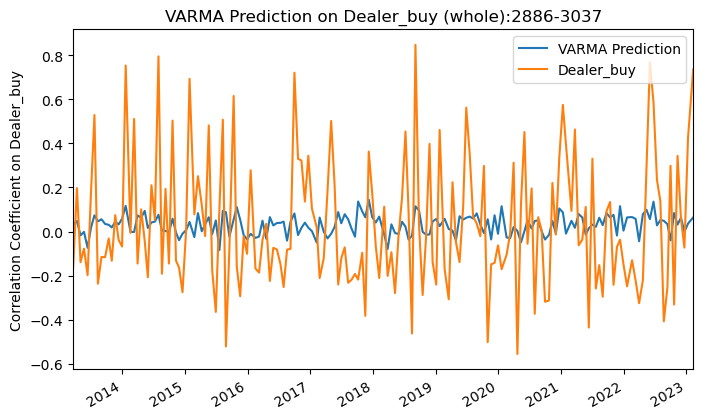

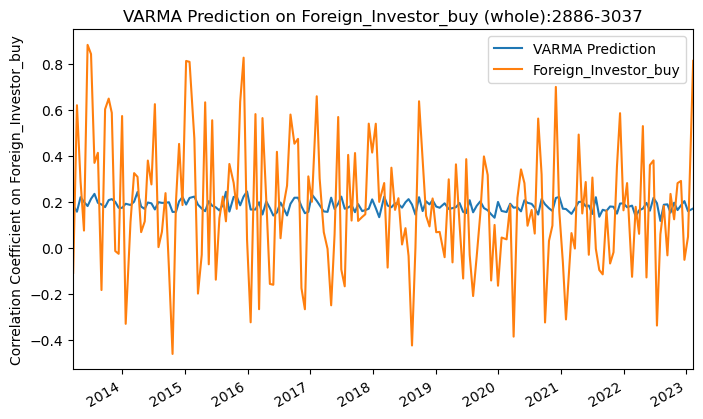

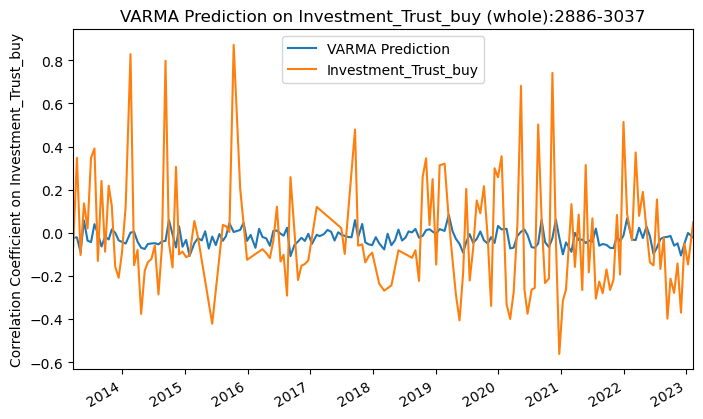

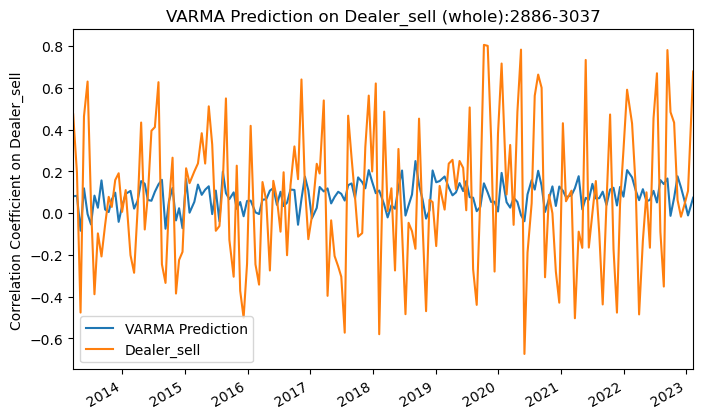

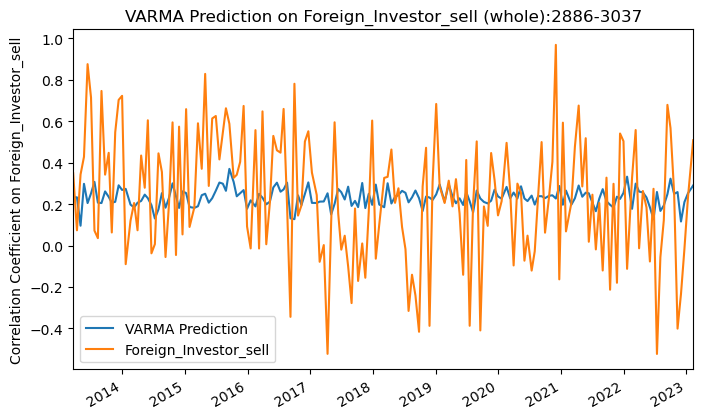

...

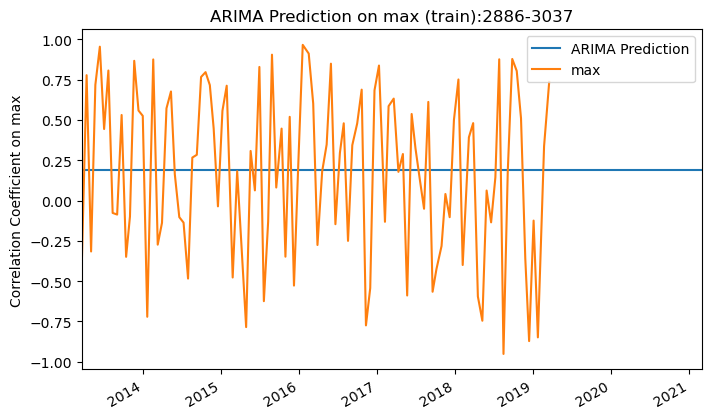

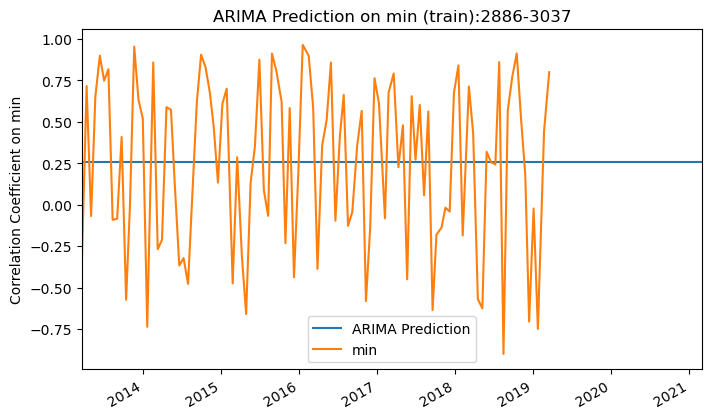

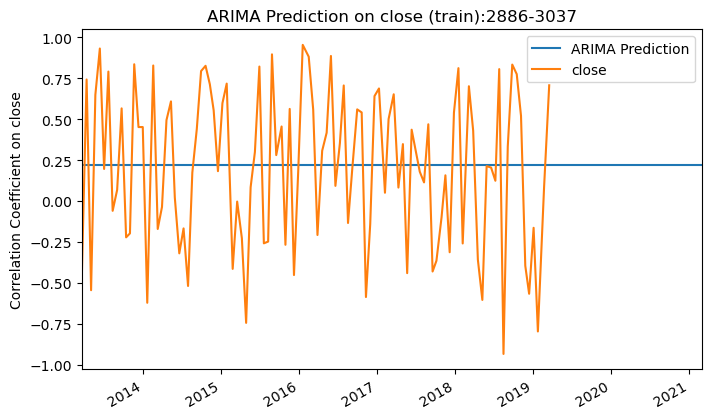

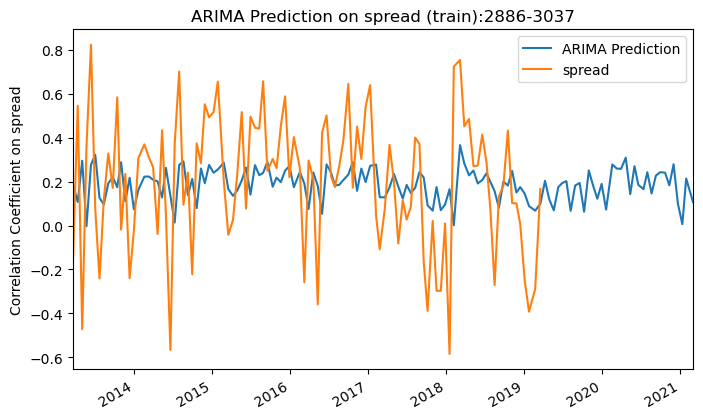

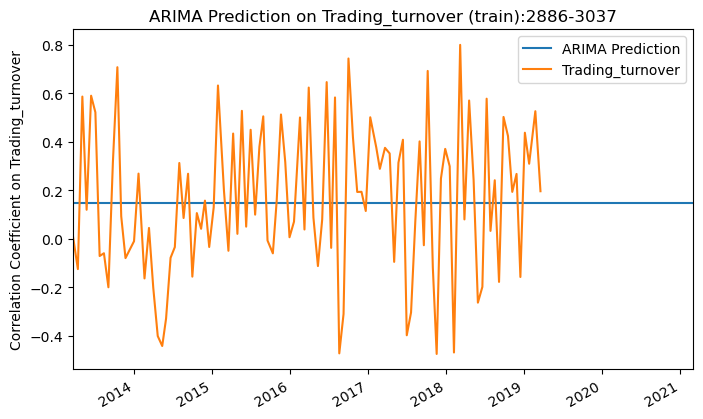

In [58]:
ticker1,ticker2 = re.findall(r"\d+", filename)[0], re.findall(r"\d+", filename)[1]
arima_tools.visualize(corr_matrix, varma_prediction, ticker1, ticker2, 'VARMA', 0, 0, nobs)
arima_tools.visualize(corr_matrix, arima_prediction, ticker1, ticker2, 'ARIMA', 0, 0, nobs)
arima_tools.visualize(corr_matrix[-nobs:], varma_test_forecast, ticker1, ticker2, 'VARMA', 1, 0, nobs)
arima_tools.visualize(corr_matrix[-nobs:], arima_test_forecast, ticker1, ticker2, 'ARIMA', 1, 0, nobs)
arima_tools.visualize(corr_matrix[:-nobs], varma_train_predict, ticker1, ticker2, 'VARMA', 0, 1, nobs)
arima_tools.visualize(corr_matrix[:-nobs], arima_train_predict, ticker1, ticker2, 'ARIMA', 0, 1, nobs)